<a href="https://colab.research.google.com/github/yushendye/AerialInspection/blob/main/detectron_fresh_train_11_sept.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 24 kB/s 
     |████████████████████████████████| 6.6 MB 26.0 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninstalled torchvision-0.10.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 5.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=80598fa2a1e1001e99aa0f35a91de8

In [3]:
# install detectron2:
!!pip install detectron2==0.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

['Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html',
 'Collecting detectron2==0.3',
 '  Downloading https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/detectron2-0.3%2Bcu101-cp37-cp37m-linux_x86_64.whl (6.9 MB)',
 '\x1b[?25l',
 '\x1b[K     |                                | 10 kB 171 kB/s eta 0:00:40',
 '\x1b[K     |                                | 20 kB 341 kB/s eta 0:00:21',
 '\x1b[K     |▏                               | 30 kB 506 kB/s eta 0:00:14',
 '\x1b[K     |▏                               | 40 kB 664 kB/s eta 0:00:11',
 '\x1b[K     |▎                               | 51 kB 818 kB/s eta 0:00:09',
 '\x1b[K     |▎                               | 61 kB 513 kB/s eta 0:00:14',
 '\x1b[K     |▍                               | 71 kB 595 kB/s eta 0:00:12',
 '\x1b[K     |▍                               | 81 kB 676 kB/s eta 0:00:11',
 '\x1b[K     |▍                               | 92 kB 755 kB/s eta 0:00:09',
 '\x1b[K     |▌        

In [4]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [5]:
#getting training data
%cd /content/
!gdown --id 1Hh7XFuyPV2qH5Pg6sqce6WmdOZoSh-th
!gdown --id 1FeJJYBgcfuZsunkk-WQFkHO8ry-Ywhrn

!unzip /content/Dataset.zip

/content
Downloading...
From: https://drive.google.com/uc?id=1Hh7XFuyPV2qH5Pg6sqce6WmdOZoSh-th
To: /content/main.json
100% 1.54M/1.54M [00:00<00:00, 49.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1FeJJYBgcfuZsunkk-WQFkHO8ry-Ywhrn
To: /content/Dataset.zip
114MB [00:01, 64.2MB/s]
Archive:  /content/Dataset.zip
   creating: Dataset/
  inflating: Dataset/000000010363.jpg  
  inflating: Dataset/000000014380.jpg  
  inflating: Dataset/000000018837.jpg  
  inflating: Dataset/000000022755.jpg  
  inflating: Dataset/000000026926.jpg  
  inflating: Dataset/000000030828.jpg  
  inflating: Dataset/000000031118.jpg  
  inflating: Dataset/000000032941.jpg  
  inflating: Dataset/000000033109.jpg  
  inflating: Dataset/000000033221.jpg  
  inflating: Dataset/000000045596.jpg  
  inflating: Dataset/000000057597.jpg  
  inflating: Dataset/000000057672.jpg  
  inflating: Dataset/000000067616.jpg  
  inflating: Dataset/000000068093.jpg  
  inflating: Dataset/000000074058.jpg  
  inflating: 

In [6]:
#getting test data
%cd /content/

!gdown --id 1WJxlhhb-fYf6YxXPkuWbxeuFF1kyn4QR

!gdown --id 1pay0cn54PgEniz3Sctv01aKoSODmL_36
!unzip /content/test_data.zip

/content
Downloading...
From: https://drive.google.com/uc?id=1WJxlhhb-fYf6YxXPkuWbxeuFF1kyn4QR
To: /content/main.json
100% 386k/386k [00:00<00:00, 51.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=1pay0cn54PgEniz3Sctv01aKoSODmL_36
To: /content/test_data.zip
36.4MB [00:00, 115MB/s] 
Archive:  /content/test_data.zip
   creating: test_data/
  inflating: test_data/COCO_val2014_000000451623.jpg  
  inflating: test_data/COCO_val2014_000000500826.jpg  
  inflating: test_data/COCO_val2014_000000255036.jpg  
  inflating: test_data/COCO_val2014_000000377832.jpg  
  inflating: test_data/COCO_val2014_000000279596.jpg  
  inflating: test_data/COCO_val2014_000000009274.jpg  
  inflating: test_data/COCO_val2014_000000082921.jpg  
  inflating: test_data/COCO_val2014_000000549943.jpg  
  inflating: test_data/COCO_val2014_000000287725.jpg  
  inflating: test_data/COCO_val2014_000000410712.jpg  
  inflating: test_data/COCO_val2014_000000230450.jpg  
  inflating: test_data/COCO_val2014_0000003

In [7]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train.json", "/content/Dataset")
register_coco_instances("my_dataset_val", {}, "/content/main.json", "/content/test_data")
register_coco_instances("my_dataset_test", {}, "/content/main.json", "/content/test_data")

[09/11 08:11:01 d2.data.datasets.coco]: Loaded 689 images in COCO format from /content/train.json


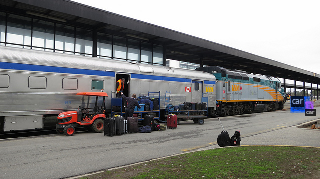

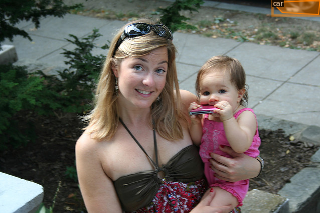

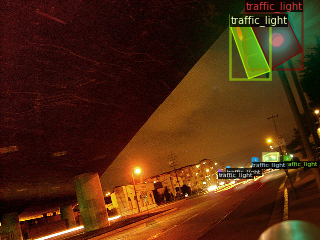

In [8]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

WARNING [09/11 08:11:02 d2.data.datasets.coco]: /content/main.json contains 600 annotations, but only 597 of them match to images in the file.
[09/11 08:11:02 d2.data.datasets.coco]: Loaded 190 images in COCO format from /content/main.json


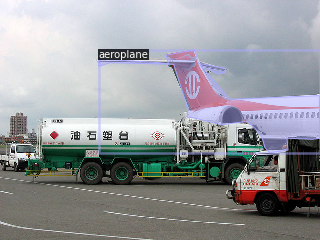

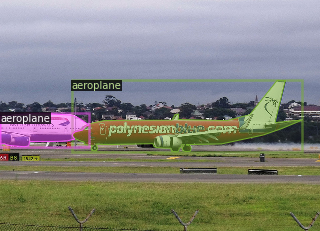

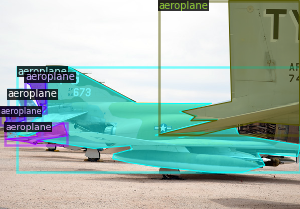

In [9]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_val")
dataset_dicts = DatasetCatalog.get("my_dataset_val")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [10]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator
from detectron2.data import transforms as T

from detectron2.data import (
    MetadataCatalog,
    build_detection_test_loader,
    build_detection_train_loader,
)

from detectron2.data import DatasetMapper   # the default mapper

In [11]:
class CocoTrainer(DefaultTrainer):
  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):
    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [12]:
!nvidia-smi

Sat Sep 11 08:11:17 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P8    28W / 149W |      3MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [15]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg

#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/9_September_Detectron/"
cfg.SOLVER.CHECKPOINT_PERIOD = 800
cfg.merge_from_file(model_zoo.get_config_file("Misc/scratch_mask_rcnn_R_50_FPN_9x_syncbn.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("Misc/scratch_mask_rcnn_R_50_FPN_9x_syncbn.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 54500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[09/11 10:01:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(
      256, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
      (norm): NaiveSyncBatchNorm(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (fpn_output2): Conv2d(
      256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
      (norm): NaiveSyncBatchNorm(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (fpn_lateral3): Conv2d(
      512, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
      (norm): NaiveSyncBatchNorm(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (fpn_output3): Conv2d(
      256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
      (norm): NaiveSyncBatchNorm(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (fpn_lateral4): Conv2d(
      1024, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
      (

In [16]:
import os
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_train", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_train")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [09/11 10:28:41 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
[09/11 10:28:41 d2.data.datasets.coco]: Loaded 689 images in COCO format from /content/train.json
[09/11 10:28:41 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/11 10:28:41 d2.data.common]: Serializing 689 elements to byte tensors and concatenating them all ...
[09/11 10:28:41 d2.data.common]: Serialized dataset takes 1.33 MiB
[09/11 10:28:41 d2.evaluation.evaluator]: Start inference on 689 images
[09/11 10:28:46 d2.evaluation.evaluator]: Inference done 11/689. 0.4167 s / img. ETA=0:04:47
[09/11 10:28:51 d2.evaluation.evaluator]: Inference done 24/689. 0.3973 s / img. ETA=0:04:30
[09/11 10:28:56 d2.evaluation.evaluator]: Inference done 37/689. 0.3964 s / img. ETA=0:04:24
[09/11 10:29:02 d2.evaluation.evaluator]: I

OrderedDict([('bbox',
              {'AP': 70.61244684812965,
               'AP-aeroplane': 84.27817336333193,
               'AP-car': 65.00783390317886,
               'AP-chair': 71.80674137778666,
               'AP-cow': 75.7425376672569,
               'AP-person': 63.725593901748276,
               'AP-traffic_light': 63.11380087547531,
               'AP50': 92.77286152898648,
               'AP75': 82.43572535930275,
               'APl': 83.69837175411364,
               'APm': 76.26336792611906,
               'APs': 63.593726238604816}),
             ('segm',
              {'AP': 55.661284699994,
               'AP-aeroplane': 60.86750512144247,
               'AP-car': 55.448101734170386,
               'AP-chair': 51.01252240975961,
               'AP-cow': 59.059903804331746,
               'AP-person': 50.81616686147752,
               'AP-traffic_light': 56.763508268782246,
               'AP50': 89.3313886801279,
               'AP75': 63.8091711646578,
             

In [ ]:
import os
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/2_September_Detectron/model_final.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [09/04 11:29:00 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
WARNING [09/04 11:29:00 d2.data.datasets.coco]: /content/main.json contains 600 annotations, but only 597 of them match to images in the file.
[09/04 11:29:00 d2.data.datasets.coco]: Loaded 190 images in COCO format from /content/main.json
[09/04 11:29:00 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/04 11:29:00 d2.data.common]: Serializing 190 elements to byte tensors and concatenating them all ...
[09/04 11:29:00 d2.data.common]: Serialized dataset takes 0.34 MiB
[09/04 11:29:00 d2.evaluation.evaluator]: Start inference on 190 images
[09/04 11:29:05 d2.evaluation.evaluator]: Inference done 11/190. 0.4501 s / img. ETA=0:01:22
[09/04 11:29:11 d2.evaluation.evaluator]: Inference done 22/190. 0.4643 s / img. ETA=0:

In [17]:
!wget https://thumbs.dreamstime.com/z/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg

--2021-09-11 10:34:20--  https://thumbs.dreamstime.com/z/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg
Resolving thumbs.dreamstime.com (thumbs.dreamstime.com)... 192.229.163.122
Connecting to thumbs.dreamstime.com (thumbs.dreamstime.com)|192.229.163.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 297652 (291K) [image/jpeg]
Saving to: ‘group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg’

group-young-people- 100%[===================>] 290.68K  --.-KB/s    in 0.03s   

2021-09-11 10:34:20 (9.43 MB/s) - ‘group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg’ saved [297652/297652]



In [18]:
import cv2
im = cv2.imread('/content/test_data/000000082688.jpg')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

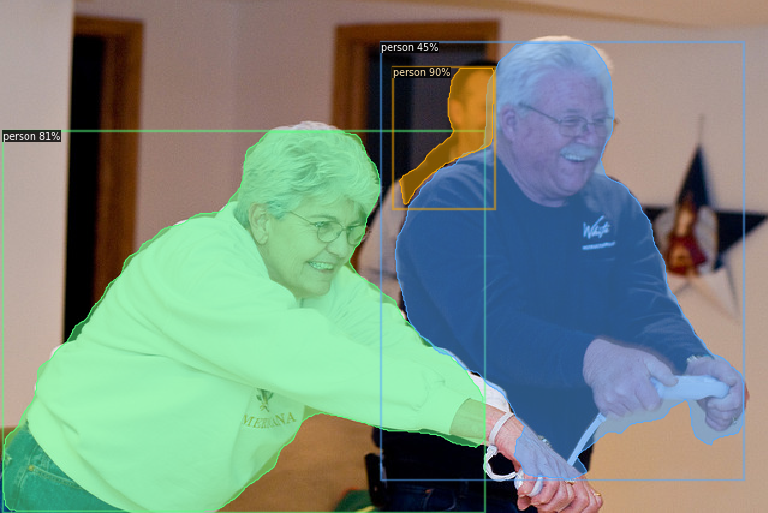

In [19]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

/content
--2021-09-11 10:34:24--  https://thumbs.dreamstime.com/z/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg
Resolving thumbs.dreamstime.com (thumbs.dreamstime.com)... 192.229.163.122
Connecting to thumbs.dreamstime.com (thumbs.dreamstime.com)|192.229.163.122|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 297652 (291K) [image/jpeg]
Saving to: ‘group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg.1’

group-young-people- 100%[===================>] 290.68K  --.-KB/s    in 0.03s   

2021-09-11 10:34:25 (9.33 MB/s) - ‘group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg.1’ saved [297652/297652]



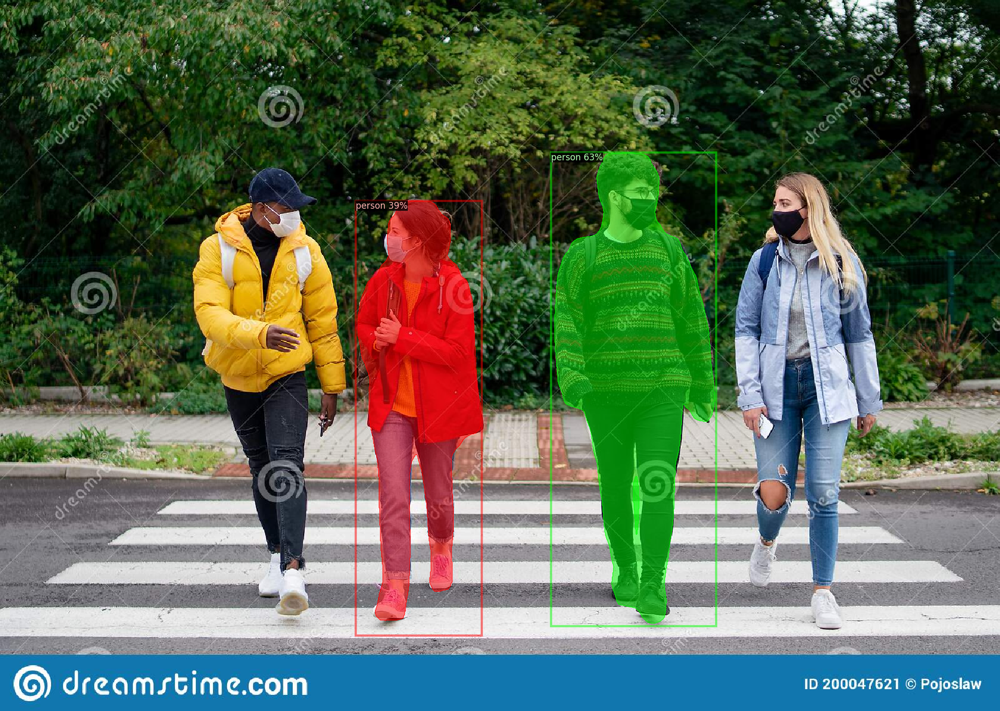

In [20]:
%cd /content/
!wget https://thumbs.dreamstime.com/z/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg
import cv2
im = cv2.imread('/content/group-young-people-crossing-road-outdoors-town-talking-coronavirus-concept-portrait-200047621.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

--2021-09-11 10:34:28--  https://media.wired.com/photos/593257829be5e55af6c24476/master/w_2560%2Cc_limit/trafficlight-inline.jpg
Resolving media.wired.com (media.wired.com)... 151.101.0.239, 151.101.64.239, 151.101.128.239, ...
Connecting to media.wired.com (media.wired.com)|151.101.0.239|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 65217 (64K) [image/jpeg]
Saving to: ‘trafficlight-inline.jpg’

trafficlight-inline 100%[===================>]  63.69K  --.-KB/s    in 0.01s   

2021-09-11 10:34:28 (5.55 MB/s) - ‘trafficlight-inline.jpg’ saved [65217/65217]



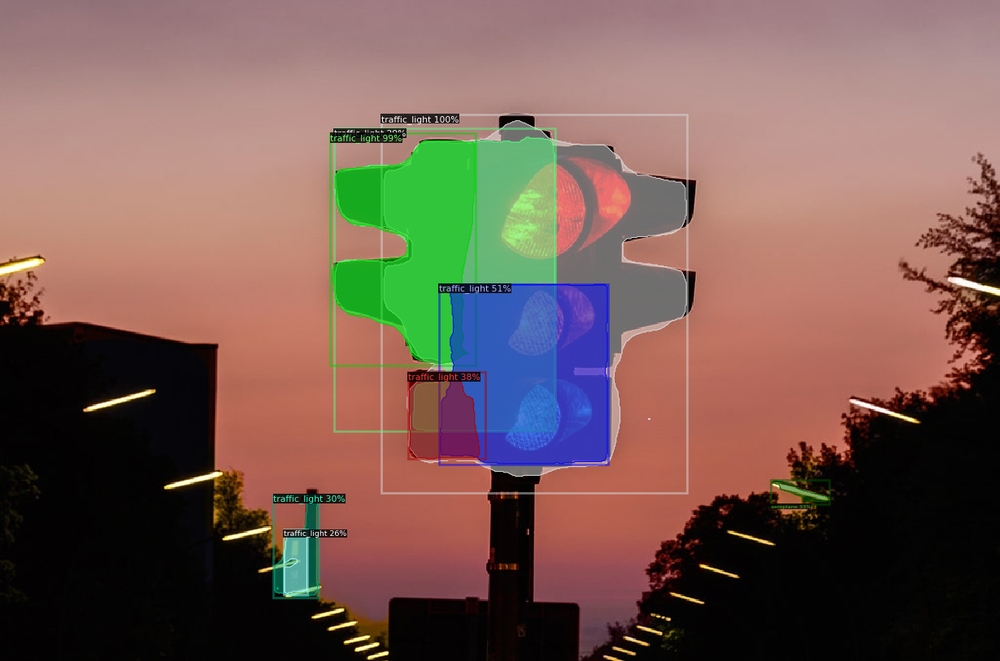

In [21]:
!wget https://media.wired.com/photos/593257829be5e55af6c24476/master/w_2560%2Cc_limit/trafficlight-inline.jpg

import cv2
im = cv2.imread('/content/trafficlight-inline.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

--2021-09-11 10:34:31--  https://www.betterteam.com/images/what-is-people-operations-2400x2400-20201118.jpg
Resolving www.betterteam.com (www.betterteam.com)... 151.101.2.133, 151.101.66.133, 151.101.130.133, ...
Connecting to www.betterteam.com (www.betterteam.com)|151.101.2.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244836 (239K) [image/jpeg]
Saving to: ‘what-is-people-operations-2400x2400-20201118.jpg’

what-is-people-oper 100%[===================>] 239.10K  --.-KB/s    in 0.03s   

2021-09-11 10:34:31 (8.98 MB/s) - ‘what-is-people-operations-2400x2400-20201118.jpg’ saved [244836/244836]



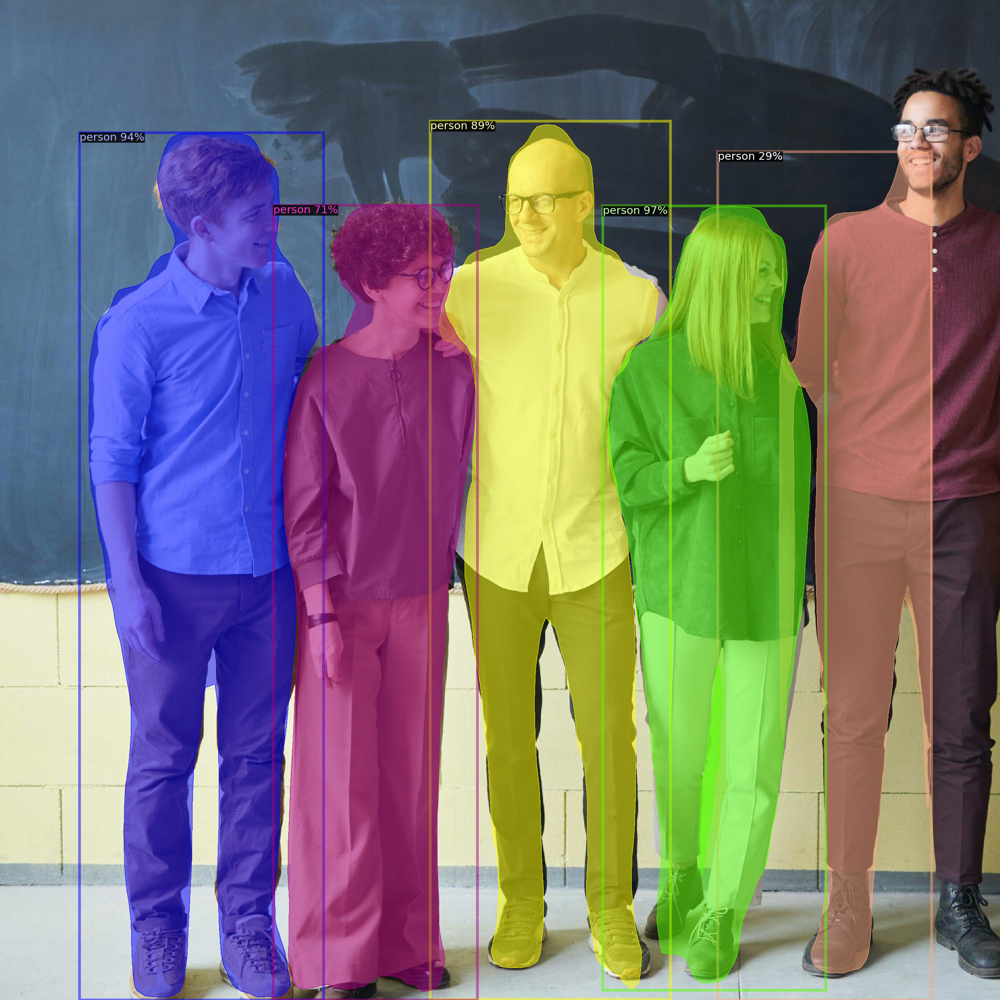

In [22]:
!wget https://www.betterteam.com/images/what-is-people-operations-2400x2400-20201118.jpg
import cv2
im = cv2.imread('/content/what-is-people-operations-2400x2400-20201118.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

--2021-09-11 10:34:35--  https://fotservis.typepad.com/photos/ndia_rajasthan_photo/cow_umbrella.jpg
Resolving fotservis.typepad.com (fotservis.typepad.com)... 104.18.139.190, 104.18.140.190, 104.18.138.190, ...
Connecting to fotservis.typepad.com (fotservis.typepad.com)|104.18.139.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 69010 (67K) [image/jpeg]
Saving to: ‘cow_umbrella.jpg’

cow_umbrella.jpg    100%[===================>]  67.39K  --.-KB/s    in 0.01s   

2021-09-11 10:34:36 (5.23 MB/s) - ‘cow_umbrella.jpg’ saved [69010/69010]



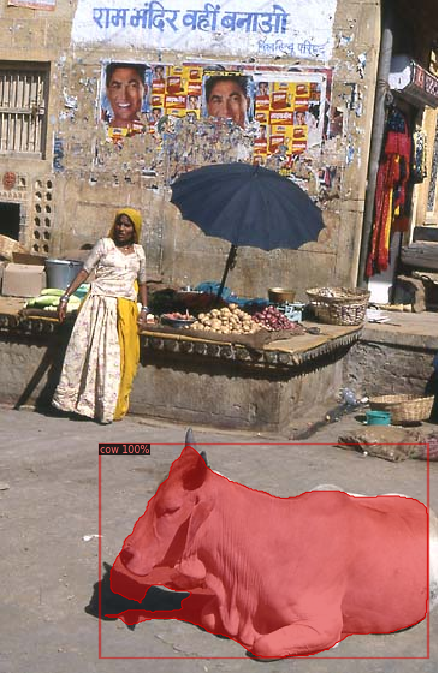

In [23]:
!wget https://fotservis.typepad.com/photos/ndia_rajasthan_photo/cow_umbrella.jpg

import cv2
im = cv2.imread('/content/cow_umbrella.jpg')

predictor = DefaultPredictor(cfg)
outputs = predictor(im)

# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
!gdown --id 1pW_RdQYgLl-VGf-g1sraMfuD2T4ayvXa

Downloading...
From: https://drive.google.com/uc?id=1pW_RdQYgLl-VGf-g1sraMfuD2T4ayvXa
To: /content/PSArips.com _ Brooklyn.Nine-Nine.S06E18.Suicide.Squad.720p.WEBRip.2CH.x265.HEVC-PSA - VLC media player 2021-08-30 20-08-00.mp4
45.9MB [00:00, 146MB/s] 


In [ ]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes) with the "demo.py" tool we provided in the repo.
!git clone https://github.com/facebookresearch/detectron2

Cloning into 'detectron2'...
remote: Enumerating objects: 12967, done.
remote: Counting objects: 100% (468/468), done.
remote: Compressing objects: 100% (276/276), done.
remote: Total 12967 (delta 251), reused 356 (delta 188), pack-reused 12499
Receiving objects: 100% (12967/12967), 5.56 MiB | 16.65 MiB/s, done.
Resolving deltas: 100% (9199/9199), done.


In [ ]:
%run detectron2/demo/demo.py --config-file detectron2/configs/Misc/cascade_mask_rcnn_R_50_FPN_3x.yaml --video-input /content/video.mp4 --confidence-threshold 0.25 --output video-output.mkv \
  --opts MODEL.WEIGHTS /content/drive/MyDrive/30_Aug_Detectron/model_final.pth

[09/02 11:48:43 detectron2]: Arguments: Namespace(confidence_threshold=0.25, config_file='detectron2/configs/Misc/cascade_mask_rcnn_R_50_FPN_3x.yaml', input=None, opts=['MODEL.WEIGHTS', '/content/drive/MyDrive/30_Aug_Detectron/model_final.pth'], output='video-output.mkv', video_input='/content/video.mp4', webcam=False)
[09/02 11:48:44 fvcore.common.checkpoint]: [Checkpointer] Loading from /content/drive/MyDrive/30_Aug_Detectron/model_final.pth ...
WARNING [09/02 11:48:52 fvcore.common.checkpoint]: Skip loading parameter 'roi_heads.box_predictor.0.cls_score.weight' to the model due to incompatible shapes: (7, 1024) in the checkpoint but (81, 1024) in the model! You might want to double check if this is expected.
WARNING [09/02 11:48:52 fvcore.common.checkpoint]: Skip loading parameter 'roi_heads.box_predictor.0.cls_score.bias' to the model due to incompatible shapes: (7,) in the checkpoint but (81,) in the model! You might want to double check if this is expected.
WARNING [09/02 11:48:5

AssertionError: ignored

In [ ]:
!cp /content/video-output.mkv /content/drive/MyDrive/